In [47]:
import numpy as np
import matplotlib.pylab as plt
import seaborn as sns
from matplotlib.patches import Ellipse
from scipy.stats import multivariate_normal
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

from abc import ABC, abstractmethod
from pbsom.SOEM import SOEM
from pbsom.Monitor import Monitor
from pbsom.Utils import RectangularLattice

### Example

In [48]:
def generate_mixture(means, covarinces, probabilities, n_samples):
    mixture_indexes = np.random.choice(a=probabilities.size, p=probabilities, size=n_samples)
    
    labels = []
    data = []
    for idx in (mixture_indexes):
        mean = means[idx]
        cov = covarinces[idx]

        data.append(np.random.multivariate_normal(mean, cov))
        labels.append(idx)

    return np.array(data), np.array(labels)

In [49]:
n_samples = 500

# Define the parameters for the 2D Gaussian finite mixture
means = np.array([[0, -2], [5, -5], [7.2, 8.2], [5.7, 2.7]])

# Define covariances for each component
covariances = np.array([[[1, 0], [0, 1]],  
                        [[1, 0.5], [0.5, 1]],  
                        [[1.5, 0.3], [0.3, 2]],
                        [[2, 0.7], [0.7, 1.5]]])

probabilities = np.array([0.2, 0.5, 0.1, 0.2])

In [50]:
data, labels = generate_mixture(means, covariances, probabilities, n_samples)

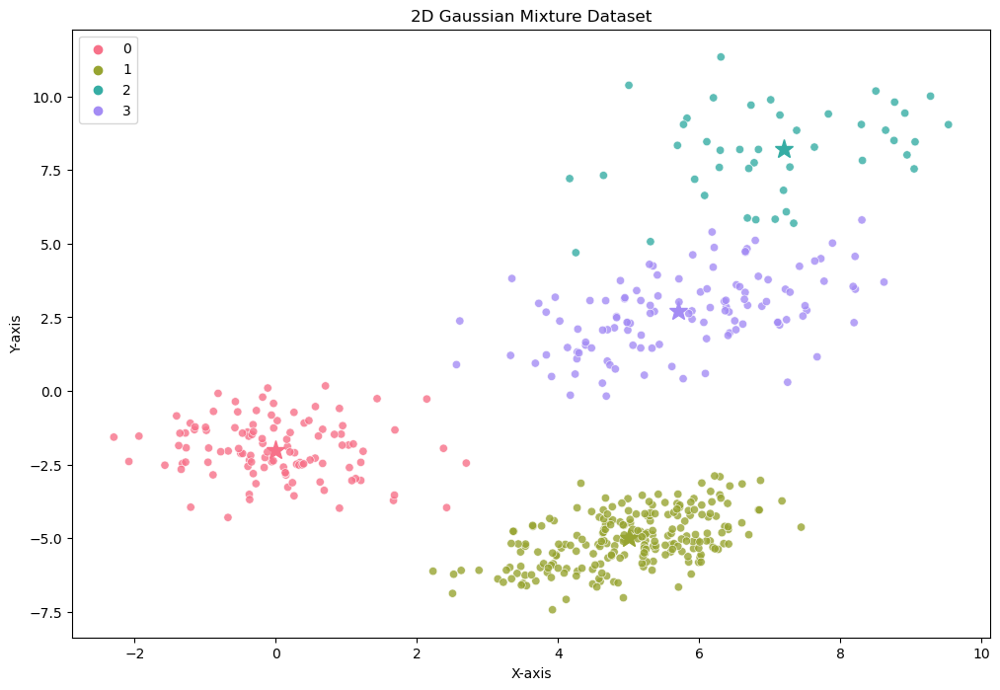

In [51]:
fig, ax = plt.subplots(figsize=(12, 8))

# Generate data points from the 2D Gaussian mixture

custom_palette = sns.color_palette("husl", len(np.unique(labels)))  # Use Seaborn's "husl" palette for n colors

# Visualize the generated data
sns.scatterplot(x=data[:, 0], y=data[:, 1], alpha=0.8, hue=labels, ax=ax, palette=custom_palette)

for mean, color in zip(means, custom_palette):
    ax.plot(mean[0], mean[1], color=color, markersize=14, marker='*')


ax.set_xlabel('X-axis')
ax.set_ylabel('Y-axis')
ax.set_title('2D Gaussian Mixture Dataset');

In [52]:
epochs = 50
lattice = RectangularLattice((2, 2))
som = SOEM(lattice, 1.002, random_state=34)
monitor = Monitor(epochs, som)

In [53]:
som.fit(data, epochs, monitor)

Epoch: 0
sigma^2: 0.9960119680798083
Weights, Covariance:
[-1.83831323  7.21475455] 
[[0.03338685 0.        ]
 [0.         3.92462895]]

[-2.13007303 10.14569316] 
[[0.70692008 0.        ]
 [0.         0.62759033]]

[-0.04779843  0.35448139] 
[[6.99721589e-04 0.00000000e+00]
 [0.00000000e+00 4.12023472e+00]]

[7.9868963  4.00197431] 
[[2.53627173 0.        ]
 [0.         6.69323498]]

-----------------
Responsobilities-> False
Epoch: 1
sigma^2: 0.49800598403990404
Weights, Covariance:
[ 4.12325232 -1.40657096] 
[[ 7.05921192  3.43234916]
 [ 3.43234916 18.6300898 ]]

[ 4.04052688 -1.38744814] 
[[ 7.29408637  3.36752991]
 [ 3.36752991 18.34357085]]

[ 4.20923966 -1.4265793 ] 
[[ 6.8001303   3.50320454]
 [ 3.50320454 18.9267014 ]]

[ 4.48492751 -1.41327039] 
[[ 5.97196022  3.62750936]
 [ 3.62750936 20.04573582]]

-----------------
Responsobilities-> False
Epoch: 2
sigma^2: 0.3320039893599362
Weights, Covariance:
[ 4.1746175  -1.42620849] 
[[ 6.91386463  3.4375842 ]
 [ 3.4375842  18.731830

In [54]:
monitor.weights_[-1]

array([0.21464341, 0.41193456, 0.18341344, 0.19000859])

In [55]:
fig, ax = plt.subplots(figsize=(12, 8))

def update(frame):
    ax.clear()
    epoch_nb = frame
    monitor.draw(ax, epoch_nb, data, labels, means, custom_palette)

# Create the animation
anim = FuncAnimation(fig, update, frames=epochs, interval=500, blit=False)
plt.close()  # Prevents the initial plot from displaying

# Display the animation as HTML5 video in the notebook
HTML(anim.to_jshtml())

In [56]:
video_filename = 'assets/animation_soem.mp4'

# Save the animation as an MP4 video file
anim.save(video_filename, fps=10, extra_args=['-vcodec', 'libx264'])

# Display a message after saving the video
print(f"Animation saved as {video_filename}")

Animation saved as assets/animation_soem.mp4
